#### Impoundent amplification
Test file.


In feature creating 02_All_features_creation_manually_classification_pickels.ipynb the name of function ("def ...") can be located from the feature_creation2.

Zone 1: Shape of original impoundment: (5000, 5000)
Zone 1: Shape of processed impoundment: (5000, 5000)


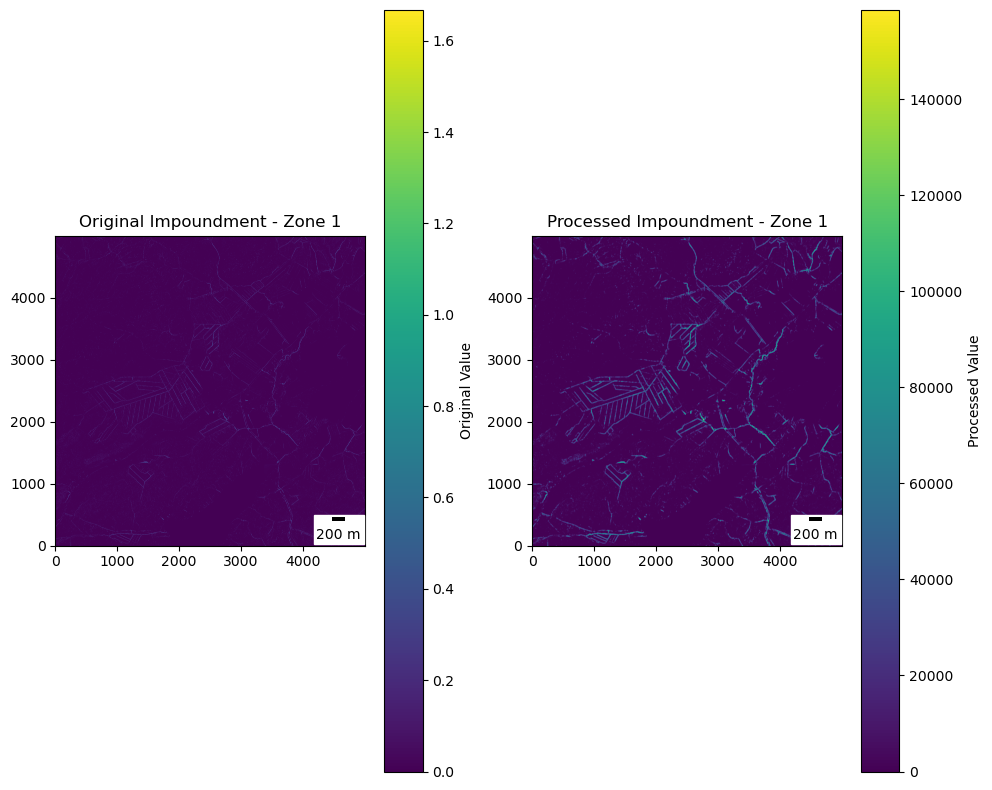

In [2]:
import numpy as np
import dask.array as da
from dask_image.ndfilters import generic_filter as d_gf
import pandas as pd
import matplotlib.pyplot as plt
from skimage.transform import resize  # For downsampling
from matplotlib_scalebar.scalebar import ScaleBar

features_path = "../../01_Data/01_Raw/features/features"


def _reclassify_impoundment(arr):
    """
    Internally used reclassification of impoundment index with different thresholds.
    """
    new_arr = np.zeros_like(arr)
    for i in range(arr.shape[0]):
        for j in range(arr.shape[1]):
            if arr[i, j] == 0:
                new_arr[i, j] = 0
            elif arr[i, j] < 0.003:
                new_arr[i, j] = 5
            elif arr[i, j] < 0.01:
                new_arr[i, j] = 50
            elif arr[i, j] < 0.02:
                new_arr[i, j] = 100
            elif arr[i, j] < 0.04:
                new_arr[i, j] = 1000
            elif arr[i, j] < 0.1:
                new_arr[i, j] = 10000
            elif arr[i, j] < 0.3:
                new_arr[i, j] = 100000
            else:
                new_arr[i, j] = 300000
    return new_arr


def create_circular_mask(radius):
    """
    Create a circular mask with a given radius.
    """
    size = 2 * radius + 1
    y, x = np.ogrid[-radius:size - radius, -radius:size - radius]
    mask = x**2 + y**2 <= radius**2
    return mask


def impoundment_amplification(arr, mask_radius=6):
    """
    Impoundment ditch enhancement.
    """
    # Reclassify the array
    reclassified_arr = _reclassify_impoundment(arr)

    # Convert the array to a Dask array for processing
    norm_arr = da.from_array(reclassified_arr, chunks=(800, 800))

    # Create the mask
    mask = create_circular_mask(mask_radius)

    # Apply the filters
    result = d_gf(
        d_gf(
            d_gf(norm_arr, np.nanmean, footprint=mask),
            np.nanmean, footprint=mask
        ),
        np.nanmedian, footprint=mask
    ).compute(scheduler="processes")

    return result


def impoundment_amplification_single(zone_number):
    """
    Loads raw impoundment data for a single zone, processes it using impoundment_amplification,
    and displays the results.
    """
    # Load the impoundment data for the specified zone
    imp = np.load(f"{features_path}/impoundment_12.npy")
    print(f"Zone {zone_number}: Shape of original impoundment: {imp.shape}")

    # Process the impoundment data
    imp_processed = impoundment_amplification(imp)
    print(f"Zone {zone_number}: Shape of processed impoundment: {imp_processed.shape}")

    # Visualize the original and processed data
    plt.figure(figsize=(10, 8))
    
    # Original Impoundment Image
    plt.subplot(1, 2, 1)
    im1 = plt.imshow(imp, cmap="viridis", origin="lower")
    plt.title(f"Original Impoundment - Zone {zone_number}")
    plt.colorbar(im1, label="Original Value")

    # Add scalebar to original image
    scalebar1 = ScaleBar(1, location='lower right', units="m", length_fraction=0.1)
    plt.gca().add_artist(scalebar1)

    # Processed Impoundment Image
    plt.subplot(1, 2, 2)
    im2 = plt.imshow(imp_processed, cmap="viridis", origin="lower")
    plt.title(f"Processed Impoundment - Zone {zone_number}")
    plt.colorbar(im2, label="Processed Value")

    # Add scalebar to processed image
    scalebar2 = ScaleBar(1, location='lower right', units="m", length_fraction=0.1)
    plt.gca().add_artist(scalebar2)

    # Adjust layout and display
    plt.tight_layout()
    plt.show()

    # Return the processed data
    return {
        "zone_number": zone_number,
        "original_shape": imp.shape,
        "processed_shape": imp_processed.shape
    }


# Call the function for a single zone
zone_number = 1  # Specify the zone number you want to process
result = impoundment_amplification_single(zone_number)


# HPMF filter

In [5]:
import numpy as np
import dask.array as da
from dask_image.ndfilters import generic_filter as d_gf
import pandas as pd
import matplotlib.pyplot as plt
from skimage.transform import resize  # For downsampling
from numba import jit, njit

#### Älä koske tähän koodiin, se on hyvä

In [24]:

features_path = "../../01_Data/01_Raw/features/features"

@jit(nopython=True)
def _reclassify_hpmf_filter(arr):
    """
    Internally used reclassification of HPMF with different thresholds.
    """
    binary = np.copy(arr)
    for i in range(len(arr)):
        for j in range(len(arr[i])):
            if arr[i][j] < 0.000001 and arr[i][j] > -0.000001:
                binary[i][j] = 100
            else:
                binary[i][j] = 0
    return binary


@jit(nopython=True)
def _reclassify_hpmf_filter(arr):
    """
    Internally used reclassification of HPMF with different thresholds.
    """
    reclassify = np.copy(arr)
    for i in range(len(arr)):
        for j in range(len(arr[i])):
            if arr[i][j] < 1:
                reclassify[i][j] = 0
            elif arr[i][j] < 3:
                reclassify[i][j] = 1
            elif arr[i][j] < 7:
                reclassify[i][j] = 2
            elif arr[i][j] < 10:
                reclassify[i][j] = 50
            elif arr[i][j] < 20:
                reclassify[i][j] = 75
            elif arr[i][j] < 50:
                reclassify[i][j] = 100
            elif arr[i][j] < 80:
                reclassify[i][j] = 300
            elif arr[i][j] < 100:
                reclassify[i][j] = 600
            else:
                reclassify[i][j] = 1000
    return reclassify


@jit
def hpmf_filter(arr):
    """
    HPMF ditch enhancement.
    """
    normalized_arr = da.from_array(
    _reclassify_hpmf_filter(arr), chunks=(800, 800))

    mean = d_gf(d_gf(d_gf(d_gf(normalized_arr, np.amax, footprint=create_circular_mask(1)), np.amax, footprint=create_circular_mask(
        1)), np.median, footprint=create_circular_mask(2)), np.nanmean, footprint=create_circular_mask(5)).compute(scheduler='processes')
    reclassify = da.from_array(
        _reclassify_hpmf_filter(mean), chunks=(800, 800))

    return d_gf(reclassify, np.nanmean, footprint=create_circular_mask(7))

def hpmf_filter_create(zone_number):
    """
    Loads raw impoundment data for a single zone, processes it using impoundment_amplification,
    and displays the results.
    """
    # Load the impoundment data for the specified zone
    hpmf_f = np.load(f"{features_path}/HPMF_{zone_number}.npy")
    print(f"Zone {zone_number}: Shape of original impoundment: {hpmf_f.shape}")

    # Process the impoundment data
    hpmf_f_processed = impoundment_amplification(hpmf_f)
    print(f"Zone {zone_number}: Shape of processed impoundment: {hpmf_f_processed.shape}")

    # Visualize the original and processed data
    plt.figure(figsize=(100, 80))
    plt.subplot(1, 2, 1)
    plt.imshow(hpmf_f, cmap="viridis", origin="lower")
    plt.title(f"Original HPMF filter - Zone {zone_number}")
    plt.colorbar(label="Original Value")

    plt.subplot(1, 2, 2)
    plt.imshow(hpmf_f_processed, cmap="viridis", origin="lower")
    plt.title(f"Processed HPMF filter - Zone {zone_number}")
    plt.colorbar(label="Processed Value")
    plt.tight_layout()
    plt.show()

    # Return the processed data
    return {
        "zone_number": zone_number,
        "original_shape": hpmf_f.shape,
        "processed_shape": hpmf_f.shape
    }


# Call the function for a single zone
zone_number = 12  # Specify the zone number you want to process
result = hpmf_filter_create(zone_number)

Zone 12: Shape of original impoundment: (5000, 5000)
Zone 12: Shape of processed impoundment: (5000, 5000)
